In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
from collections import defaultdict
import numpy as np
import json
%matplotlib inline

In [125]:
test_phrases = ['SARS_forecasting', 'SARS-Cov_forecasting', 'Zika_Virus_spreading', 'MERS', 
                'SARS_epidemic', 'Middle_East_Respiratory_Syndrome_outbreak', 'MERS_outbreak',
                'Severe_Acute_Respiratory_Syndrome__model', 'SARS-Cov_epidemic', 'MERS-CoV',
                'MERS_epidemic', 'SARS-Cov_outbreak', 'Middle_East_Respiratory_Syndrome_epidemic',
                'Ebolavirus_epidemic', 'MERS-CoV_forecasting', 'Ebola_forecasting', 
                'Middle_East_Respiratory_Syndrome_forecasting', 'Zika_Virus_forecasting', 'Ebola_epidemic',
                'Zika_spreading', 'Severe_Acute_Respiratory_Syndrome_forecasting', 'ZIKV_epidemic',
                'ZIKV_forecasting', 'Ebola_spreading', 'SARS-Cov_spreading', 'SARS-Cov', 'Ebolavirus_spreading',
                'Severe_Acute_Respiratory_Syndrome_spreading', 'MERS_forecasting', 'Zika_forecasting',
                'ZIKV', 'SARS_spreading', 'MERS-CoV_spreading', 'Zika_Virus', 'Ebola_virus_spreading',
                'novel_coronavirus', 'ZIKV_outbreak', 'Ebolavirus_outbreak', 'MERS-CoV_outbreak', 
                'Zika_Virus_epidemic', 'EBOV', 'Zika_Virus_outbreak', 'EBOV_outbreak', 'Ebola_virus_outbreak',
                'Severe_Acute_Respiratory_Syndrome_epidemic', 'MERS_spreading', 'Zika_Virus__model', 'Zika_epidemic',
                'Ebola', 'SARS_outbreak', 'Ebola_virus__model', 'Severe_Acute_Respiratory_Syndrome', 'EBOV_spreading',
                'Ebolavirus_forecasting', 'Severe_Acute_Respiratory_Syndrome_outbreak', 'MERS-CoV__model', 
                'MERS-CoV_epidemic', 'ZIKV_spreading', 'SARS', 'EBOV_forecasting', 'coronavirus', 'Zika', 
                'Zika_outbreak', 'EBOV_epidemic', 'Ebola_virus', 'Ebola_virus_epidemic', 'Ebola_virus_forecasting',
                'Middle_East_Respiratory_Syndrome', 'Ebolavirus', 'Middle_East_Respiratory_Syndrome_spreading',
                'Ebola_outbreak']
len(test_phrases)

71

### Generate the time series data for the above phrases using the script pmc_occurrences.py and  biorxiv_occurrences.py before running the next cells.

In [124]:
with open('PATH/to/virus/biorxiv/json') as f:
    biorxiv_y = json.load(f)
with open('PATH/to/virus/pmc/json') as f:
    pmc_y = json.load(f)

In [129]:
y_raw_freq_pmc = {}
y_raw_freq_biorxiv = {}

for key in pmc_y.keys():
    try:
        y_raw_freq_biorxiv[key] = biorxiv_y[key.replace("_", " ")][0][:-2]
    except:
        y_raw_freq_biorxiv[key] = np.zeros(74)
    y_raw_freq_pmc[key] = pmc_y[key][0][:-10]

In [130]:
fig, axes = plt.subplots(71,3, figsize = (55,71*5))

count = 0
for phrase in test_phrases:
    axes[count][0].plot(np.arange(74), y_raw_freq_biorxiv[phrase], 'g',lw=2)
    axes[count][0].grid(True)
    axes[count][1].plot(np.arange(74), y_raw_freq_pmc[phrase], 'r',lw=2)
    axes[count][1].grid(True)
    axes[count][1].set_title('raw freq for '+phrase, size=40)
    axes[count][2].plot(np.arange(74), y_raw_freq_biorxiv[phrase], 'g',lw=2)
    axes[count][2].plot(np.arange(74), y_raw_freq_pmc[phrase], 'r',lw=2)
    axes[count][2].grid(True)
    count+=1

fig.tight_layout()
plt.show()
fig.savefig('virus_phrases_curve_rawFreq.pdf')

In [131]:
y_raw_freq_pmc = {}
y_raw_freq_biorxiv = {}

for key in pmc_y.keys():
    try:
        y_raw_freq_biorxiv[key] = biorxiv_y[key.replace("_", " ")][1][:-2]
    except:
        y_raw_freq_biorxiv[key] = np.zeros(74)
    y_raw_freq_pmc[key] = pmc_y[key][1][:-10]

In [132]:
fig, axes = plt.subplots(71,3, figsize = (55,71*5))

count = 0
for phrase in test_phrases:
    axes[count][0].plot(np.arange(74), y_raw_freq_biorxiv[phrase], 'g',lw=2)
    axes[count][0].grid(True)
    axes[count][1].plot(np.arange(74), y_raw_freq_pmc[phrase], 'r',lw=2)
    axes[count][1].grid(True)
    axes[count][1].set_title('norm freq for '+phrase, size=40)
    axes[count][2].plot(np.arange(74), y_raw_freq_biorxiv[phrase], 'g',lw=2)
    axes[count][2].plot(np.arange(74), y_raw_freq_pmc[phrase], 'r',lw=2)
    axes[count][2].grid(True)
    count+=1

fig.tight_layout()
plt.show()
fig.savefig('virus_phrases_curve_normFreq.pdf')

### we create single time seris curces by combining all phrases related to certain single virus

In [134]:
dict_comp = {}
dict_comp['sars'] = ['SARS_forecasting', 'SARS-Cov_forecasting', 'SARS_epidemic', 'SARS-Cov_outbreak', 
                     'Severe_Acute_Respiratory_Syndrome_model', 'SARS-Cov_epidemic', 
                     'Severe_Acute_Respiratory_Syndrome_forecasting', 'SARS-Cov_spreading', 'SARS-Cov',
                    'Severe_Acute_Respiratory_Syndrome_spreading', 'SARS_spreading', 'Severe_Acute_Respiratory_Syndrome_epidemic',
                    'SARS_outbreak', 'Severe_Acute_Respiratory_Syndrome', 'Severe_Acute_Respiratory_Syndrome_outbreak']

dict_comp['zika'] = ['Zika_Virus_spreading', 'Zika_Virus_forecasting', 'Zika_spreading', 'ZIKV_epidemic',
                    'ZIKV_forecasting', 'Zika_forecasting', 'Zika_Virus', 'ZIKV_outbreak',
                    'Zika_Virus_epidemic', 'Zika_Virus_outbreak', 'Zika_Virus_model', 'Zika_epidemic',
                    'ZIKV_spreading', 'Zika_outbreak']

dict_comp['ebola'] = ['Ebolavirus_epidemic','Ebola_forecasting', 'Ebola_epidemic', 'Ebola_spreading',
                     'Ebolavirus_spreading', 'Ebola_virus_spreading', 'Ebolavirus_outbreak', 'EBOV',
                     'EBOV_outbreak', 'Ebola_virus_outbreak', 'Ebola_virus_model', 'EBOV_spreading',
                     'Ebolavirus_forecasting','EBOV_forecasting', 'EBOV_epidemic', 
                      'Ebola_virus_epidemic', 'Ebola_virus_forecasting', 'Ebola_outbreak']

dict_comp['mers'] = ['Middle_East_Respiratory_Syndrome_outbreak', 'MERS_outbreak', 'MERS-CoV',
                     'MERS_epidemic', 'Middle_East_Respiratory_Syndrome_epidemic', 'MERS-CoV_forecasting',
                     'Middle_East_Respiratory_Syndrome_forecasting', 'MERS_forecasting', 'MERS-CoV_spreading',
                    'MERS-CoV_outbreak', 'MERS_spreading', 'MERS-CoV_model', 'MERS-CoV_epidemic',
                    'Middle_East_Respiratory_Syndrome', 'Middle_East_Respiratory_Syndrome_spreading']

In [149]:
y_raw_freq_pmc = {}
y_raw_freq_biorxiv = {}

y_raw_freq_pmc['sars'] = np.zeros(74)
y_raw_freq_pmc['zika'] = np.zeros(74)
y_raw_freq_pmc['ebola'] = np.zeros(74)
y_raw_freq_pmc['mers'] = np.zeros(74)

y_raw_freq_biorxiv['sars'] = np.zeros(74)
y_raw_freq_biorxiv['zika'] = np.zeros(74)
y_raw_freq_biorxiv['ebola'] = np.zeros(74)
y_raw_freq_biorxiv['mers'] = np.zeros(74)

for key in dict_comp['sars']:
    for i in range(74):
        try:
            y_raw_freq_pmc['sars'][i] += pmc_y[key][0][i]
        except:
            y_raw_freq_pmc['sars'][i] += 0
        try:
            y_raw_freq_biorxiv['sars'][i] += biorxiv_y[key.replace("_", " ")][0][i]
        except:
            y_raw_freq_biorxiv['sars'][i] += 0
        
for key in dict_comp['zika']:
    for i in range(74):
        try:
            y_raw_freq_pmc['zika'][i] += pmc_y[key][0][i]
        except:
            y_raw_freq_pmc['zika'][i] += 0
        try:
            y_raw_freq_biorxiv['zika'][i] += biorxiv_y[key.replace("_", " ")][0][i]
        except:
            y_raw_freq_biorxiv['zika'][i] += 0
        
for key in dict_comp['ebola']:
    for i in range(74):
        try:
            y_raw_freq_pmc['ebola'][i] += pmc_y[key][0][i]
        except:
            y_raw_freq_pmc['ebola'][i] += 0
        try:
            y_raw_freq_biorxiv['ebola'][i] += biorxiv_y[key.replace("_", " ")][0][i]
        except:
            y_raw_freq_biorxiv['ebola'][i] += 0
        
for key in dict_comp['mers']:
    for i in range(74):
        try:
            y_raw_freq_pmc['mers'][i] += pmc_y[key][0][i]
        except:
            y_raw_freq_pmc['mers'][i] += 0
        try:
            y_raw_freq_biorxiv['mers'][i] += biorxiv_y[key.replace("_", " ")][0][i]
        except:
            y_raw_freq_biorxiv['mers'][i] += 0

## raw freq

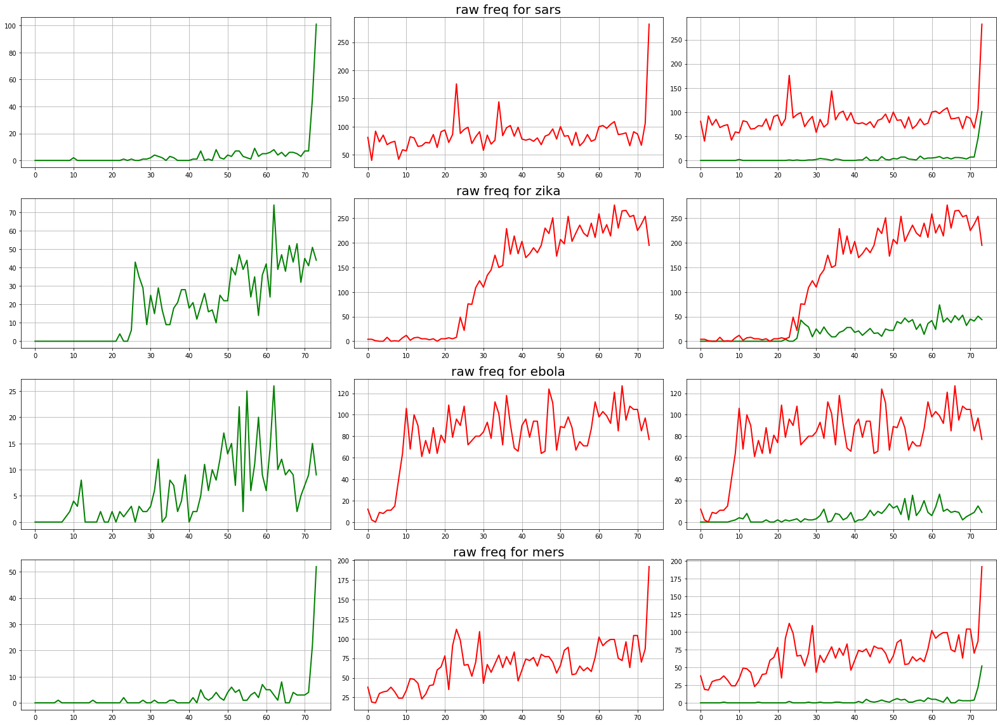

In [150]:
fig, axes = plt.subplots(4,3, figsize = (22,4*4))

count = 0
for phrase in ['sars', 'zika', 'ebola', 'mers']:
    axes[count][0].plot(np.arange(74), y_raw_freq_biorxiv[phrase], 'g',lw=2)
    axes[count][0].grid(True)
    axes[count][1].plot(np.arange(74), y_raw_freq_pmc[phrase], 'r',lw=2)
    axes[count][1].grid(True)
    axes[count][1].set_title('raw freq for '+phrase, size=20)
    axes[count][2].plot(np.arange(74), y_raw_freq_biorxiv[phrase], 'g',lw=2)
    axes[count][2].plot(np.arange(74), y_raw_freq_pmc[phrase], 'r',lw=2)
    axes[count][2].grid(True)
    count+=1

fig.tight_layout()
plt.show()
fig.savefig('virus_phrases_curve_rawFreq.pdf')

## norm freq 

In [147]:
y_raw_freq_pmc = {}
y_raw_freq_biorxiv = {}

y_raw_freq_pmc['sars'] = np.zeros(74)
y_raw_freq_pmc['zika'] = np.zeros(74)
y_raw_freq_pmc['ebola'] = np.zeros(74)
y_raw_freq_pmc['mers'] = np.zeros(74)

y_raw_freq_biorxiv['sars'] = np.zeros(74)
y_raw_freq_biorxiv['zika'] = np.zeros(74)
y_raw_freq_biorxiv['ebola'] = np.zeros(74)
y_raw_freq_biorxiv['mers'] = np.zeros(74)

for key in dict_comp['sars']:
    for i in range(74):
        try:
            y_raw_freq_pmc['sars'][i] += pmc_y[key][1][i]
        except:
            y_raw_freq_pmc['sars'][i] += 0
        try:
            y_raw_freq_biorxiv['sars'][i] += biorxiv_y[key.replace("_", " ")][1][i]
        except:
            y_raw_freq_biorxiv['sars'][i] += 0
        
for key in dict_comp['zika']:
    for i in range(74):
        try:
            y_raw_freq_pmc['zika'][i] += pmc_y[key][1][i]
        except:
            y_raw_freq_pmc['zika'][i] += 0
        try:
            y_raw_freq_biorxiv['zika'][i] += biorxiv_y[key.replace("_", " ")][1][i]
        except:
            y_raw_freq_biorxiv['zika'][i] += 0
        
for key in dict_comp['ebola']:
    for i in range(74):
        try:
            y_raw_freq_pmc['ebola'][i] += pmc_y[key][1][i]
        except:
            y_raw_freq_pmc['ebola'][i] += 0
        try:
            y_raw_freq_biorxiv['ebola'][i] += biorxiv_y[key.replace("_", " ")][1][i]
        except:
            y_raw_freq_biorxiv['ebola'][i] += 0
        
for key in dict_comp['mers']:
    for i in range(74):
        try:
            y_raw_freq_pmc['mers'][i] += pmc_y[key][1][i]
        except:
            y_raw_freq_pmc['mers'][i] += 0
        try:
            y_raw_freq_biorxiv['mers'][i] += biorxiv_y[key.replace("_", " ")][1][i]
        except:
            y_raw_freq_biorxiv['mers'][i] += 0

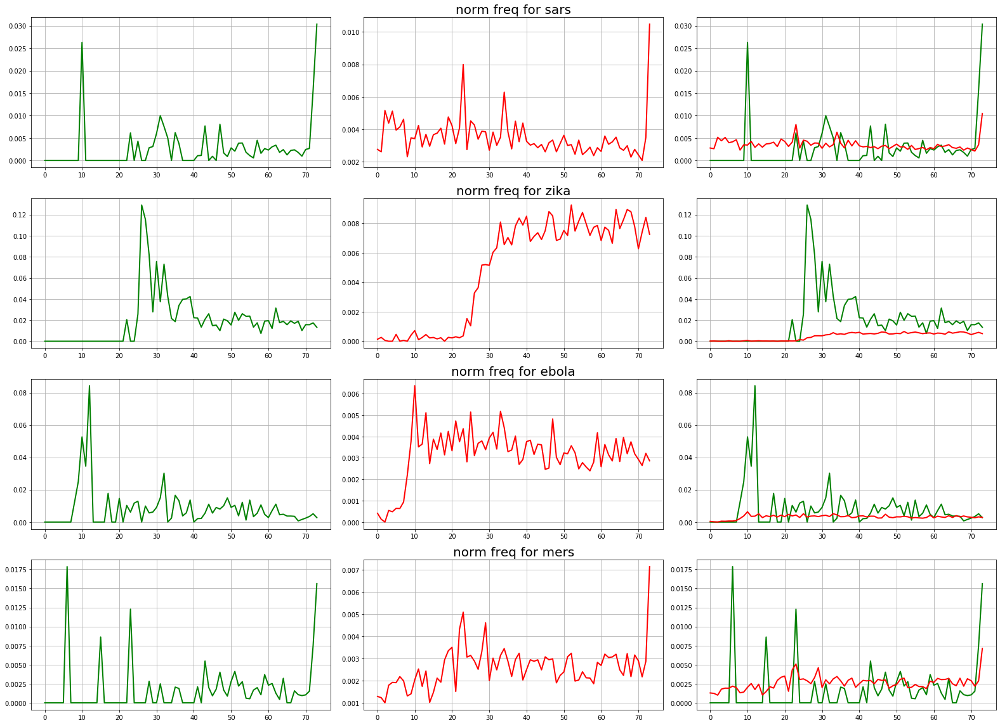

In [148]:
fig, axes = plt.subplots(4,3, figsize = (22,4*4))

count = 0
for phrase in ['sars', 'zika', 'ebola', 'mers']:
    axes[count][0].plot(np.arange(74), y_raw_freq_biorxiv[phrase], 'g',lw=2)
    axes[count][0].grid(True)
    axes[count][1].plot(np.arange(74), y_raw_freq_pmc[phrase], 'r',lw=2)
    axes[count][1].grid(True)
    axes[count][1].set_title('norm freq for '+phrase, size=20)
    axes[count][2].plot(np.arange(74), y_raw_freq_biorxiv[phrase], 'g',lw=2)
    axes[count][2].plot(np.arange(74), y_raw_freq_pmc[phrase], 'r',lw=2)
    axes[count][2].grid(True)
    count+=1

fig.tight_layout()
plt.show()
fig.savefig('virus_phrases_curve_normFreq.pdf')

### covid-19

In [153]:
dict_comp['covid19'] = ['2019-nCoV_epidemic',
'COVID2019_epidemic',
'2019-nCoV_forecasting',
'COVID2019_forecasting',
'2019-nCoV_modeling',
'COVID2019_modeling',
'2019-nCoV_model',
'COVID2019_model',
'2019-nCoV_outbreak',
'COVID2019_outbreak',
'2019-nCoV_spreading',
'COVID2019_spreading',
'coronavirus_epidemic',
'nCoV_epidemic',
'coronavirus_forecasting',
'nCoV_forecasting',
'coronavirus_modeling',
'nCoV_modeling',
'coronavirus_model',
'nCoV_model',
'coronavirus_outbreak',
'nCoV_outbreak',
'coronavirus_spreading',
'nCoV_spreading',
'COVID-19_epidemic',
'novel_coronavirus_epidemic',
'COVID19_epidemic',
'novel_coronavirus_forecasting',
'COVID-19_forecasting',
'novel_coronavirus_modeling',
'COVID19_forecasting',
'novel_coronavirus_model',
'COVID-19_modeling',
'novel_coronavirus_outbreak',
'COVID19_modeling',
'novel_coronavirus_spreading',
'COVID-19_model',
'SARS-CoV-2_epidemic',
'COVID19_model',
'SARS-CoV-2_forecasting',
'COVID-19_outbreak',
'SARS-CoV-2_modeling',
'COVID19_outbreak',
'SARS-CoV-2_model',
'COVID-19_spreading',
'SARS-CoV-2_outbreak',
'COVID19_spreading',
'SARS-CoV-2_spreading']

### Generate the time series data for the above phrases using the script pmc_occurrences.py and biorxiv_occurrences.py before running the next cells.

In [160]:
y_raw_freq_pmc = {}
y_raw_freq_biorxiv = {}

y_raw_freq_pmc['covid19'] = np.zeros(75)

y_raw_freq_biorxiv['covid19'] = np.zeros(75)

for key in dict_comp['covid19']:
    for i in range(74):
        try:
            y_raw_freq_pmc['covid19'][i] += pmc_y[key][0][i]
        except:
            y_raw_freq_pmc['covid19'][i] += 0
        try:
            y_raw_freq_biorxiv['covid19'][i] += biorxiv_y[key.replace("_", " ")][0][i]
        except:
            y_raw_freq_biorxiv['covid19'][i] += 0

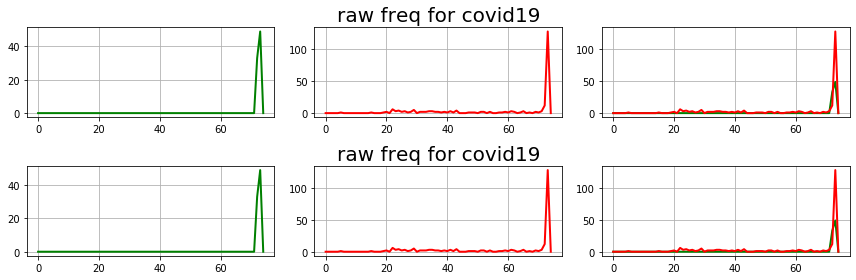

In [161]:
fig, axes = plt.subplots(2,3, figsize = (12,1*4))

count = 0
for phrase in ['covid19', 'covid19']:
    axes[count][0].plot(np.arange(75), y_raw_freq_biorxiv[phrase], 'g',lw=2)
    axes[count][0].grid(True)
    axes[count][1].plot(np.arange(75), y_raw_freq_pmc[phrase], 'r',lw=2)
    axes[count][1].grid(True)
    axes[count][1].set_title('raw freq for '+phrase, size=20)
    axes[count][2].plot(np.arange(75), y_raw_freq_biorxiv[phrase], 'g',lw=2)
    axes[count][2].plot(np.arange(75), y_raw_freq_pmc[phrase], 'r',lw=2)
    axes[count][2].grid(True)
    count+=1

fig.tight_layout()
plt.show()
fig.savefig('virus_phrases_curve_rawFreq.pdf')